In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from workalendar.asia import SouthKorea 

# statsmodel 확인
from pmdarima import auto_arima
from statsmodels.tsa.statespace.sarimax import SARIMAX

from sklearn.model_selection import train_test_split
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from multiprocessing import Pool, cpu_count
from torch.utils.data import DataLoader, TensorDataset

# 오류 무시하는 방법
import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv("/home/dlwhdtmd/zongseung/EDA/demand_celcius.csv")
df = df.set_index("일시")
df = df.drop("Unnamed: 0", axis=1)
df.index = pd.to_datetime(df.index)

### 독립변수 추가

In [3]:
import datetime as dt
cal = SouthKorea()

def holiday_weekday(data):
    holiday_data = []

    for date in data.index:

        if date.weekday() in [5, 6] or cal.is_holiday(date) is True:  # 주말 (토요일=5, 일요일=6) / 공휴일까지 포함시켜서 확인한다.
            holiday_data.append(2) # 2번은 쉬는날
        else:  # 그 외 날짜 
            holiday_data.append(1) # 안쉬는날

    data["holiday_data"] = holiday_data    
    
    return data

def get_season_by_month(month):
    asd = []
    
    for i in month: 
        if 3 <= i <= 5: 
            asd.append(1) # 봄
        elif 6 <= i <= 8:
            asd.append(2) # 여름
        elif 9 <= i <= 11:
            asd.append(3)
        else:
            asd.append(4)
    return asd

In [4]:
df["month"] = df.index.month

df_holiday = holiday_weekday(df)
df_holiday["season"] = get_season_by_month(df_holiday["month"])

In [5]:
# 더미 변수 생성 알고리즘
def select_date(data):

        dummies = pd.get_dummies(data["holiday_data"]).astype("int")
        season_dummies = pd.get_dummies(data["season"]).astype("int")
        
        data = pd.concat([data, dummies], axis = 1)
        data.drop(["holiday_data", "season"], axis=1, inplace=True)

        data.rename(columns = {1:"weekday",
        2:"weekend"}, inplace=True)

        data = pd.concat([data, season_dummies], axis = 1)

        data.rename(columns = {1:"spring",
        2:"summer",
        3:"autoum",
        4:"winter"}, inplace=True)
        
        return data

In [6]:
import datetime as dt
df.reset_index(inplace=True)
# 연,월,일 생성
df["ymd"] = df["일시"].dt.strftime('%Y-%m-%d')

# 더미 변수 생성
df = select_date(df)

In [7]:
df.set_index("일시", inplace=True)

Text(0.5, 1.0, '2019 jan demand data')

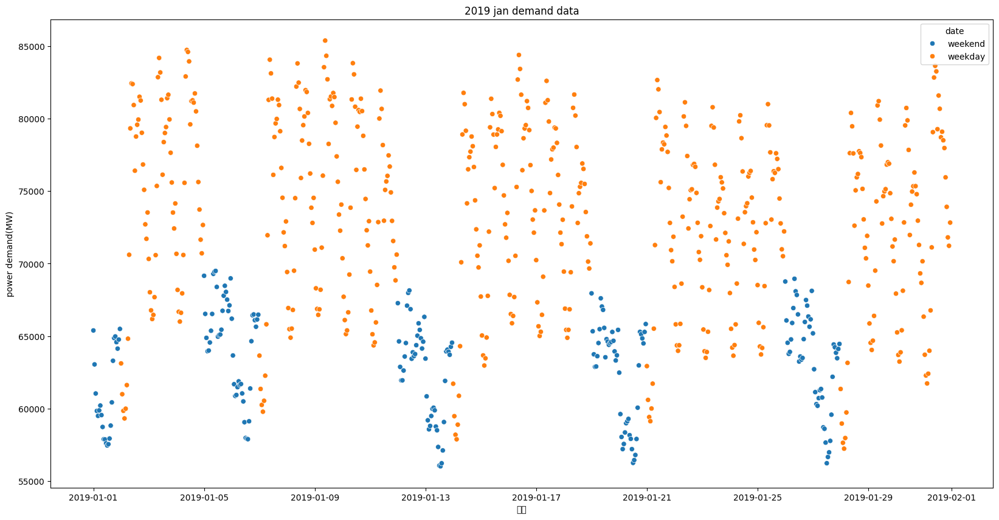

In [8]:
import seaborn as sns
df["date"] = df[["weekday", "weekend"]].idxmax(axis=1)

plt.figure(figsize=(20,10))
sns.scatterplot(x= df[:31*24].index,y=df["power demand(MW)"][:31*24], hue=df["date"][:31*24])
plt.title("2019 jan demand data")

In [9]:
df

,hm,ta,power demand(MW),month,ymd,weekday,weekend,spring,summer,autoum,winter,date
일시,,,,,,,,,,,,
2019-01-01 00:00:00,59.705026,-4.174162,65388.0,1,2019-01-01,0,1,0,0,0,1,weekend
2019-01-01 01:00:00,60.096649,-4.349947,63045.0,1,2019-01-01,0,1,0,0,0,1,weekend
2019-01-01 02:00:00,61.854850,-4.491993,61036.0,1,2019-01-01,0,1,0,0,0,1,weekend
2019-01-01 03:00:00,63.020635,-4.648325,59834.0,1,2019-01-01,0,1,0,0,0,1,weekend
2019-01-01 04:00:00,63.784303,-4.722354,59491.0,1,2019-01-01,0,1,0,0,0,1,weekend
...,...,...,...,...,...,...,...,...,...,...,...,...
2024-10-31 19:00:00,75.547619,15.667637,67551.0,10,2024-10-31,1,0,0,0,1,0,weekday
2024-10-31 20:00:00,79.587125,14.787954,65341.0,10,2024-10-31,1,0,0,0,1,0,weekday
2024-10-31 21:00:00,82.265079,14.053263,63341.0,10,2024-10-31,1,0,0,0,1,0,weekday


KeyError: 'season'

<Figure size 2000x1000 with 0 Axes>

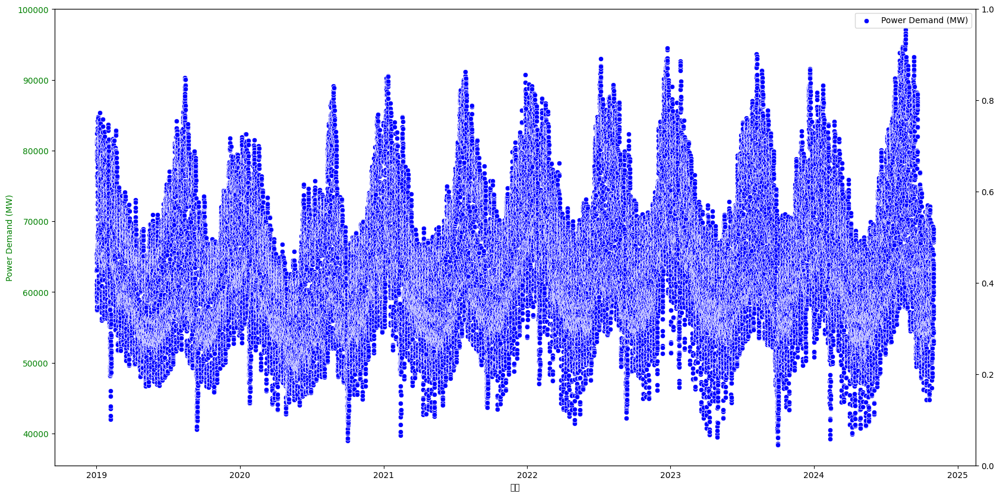

In [10]:
# 그래프 크기 설정
plt.figure(figsize=(20, 10))

# 첫 번째 축 (power demand)
fig, ax1 = plt.subplots(figsize=(20, 10))
sns.scatterplot(x=df.index, y=df["power demand(MW)"], ax=ax1, color="blue", label="Power Demand (MW)")
ax1.set_ylabel("Power Demand (MW)", color="green")
ax1.tick_params(axis='y', labelcolor="green")

# 두 번째 축 (ta) - hue 사용
ax2 = ax1.twinx()
sns.scatterplot(x=df.index, y=df["ta"], ax=ax2, hue=df["season"], palette="viridis")
ax2.set_ylabel("Temperature (ta)", color="black")
ax2.tick_params(axis='y', labelcolor="black")

# 공통 x축 라벨 설정
ax1.set_xlabel("Index")

# 그래프 제목 설정
plt.title("Power Demand vs Temperature")

# 범례 조정 (seaborn의 hue 범례만 유지)
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(handles=handles2, labels=labels2, loc="upper left")

# 그래프 표시
plt.show()

### 밑에 이상치 확인

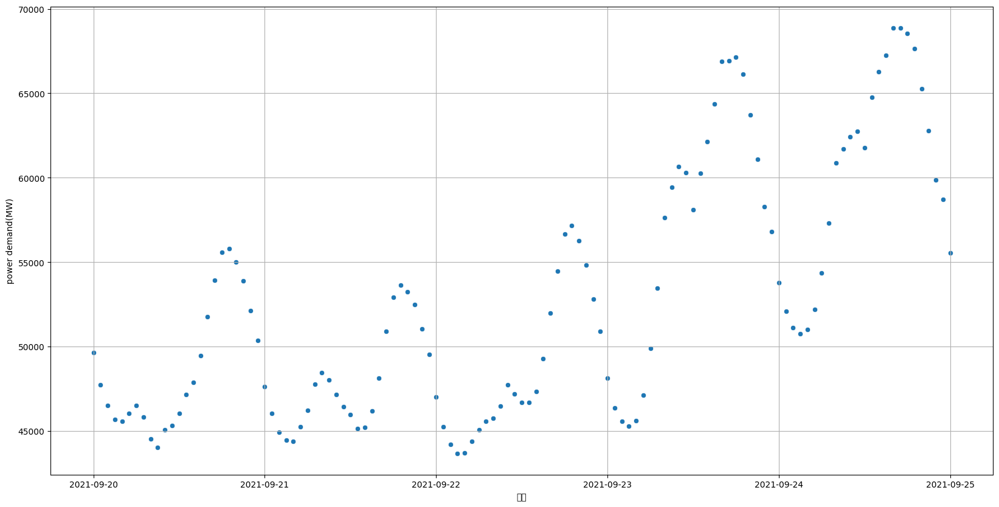

In [ ]:
# 각 년도별로 그래프 생성
fig, axs = plt.subplots(figsize=(20,10))

# 
df_2019_2 = df[(df.index>="2021-09-20") & (df.index<="2021-09-25")] # 2019 
sns.scatterplot(x=df_2019_2.index, y= df_2019_2["power demand(MW)"])
plt.grid()

### 위 그래프들을 통해서 추석, 설날 부분이 저런 패턴이 나타난다는 것을 알 수 있음 -> 그러면 추석, 설날 만 따로 뽑아서 추출해보자!

In [11]:
from lunarcalendar import Converter, Solar, Lunar

def get_solar_date(year, lunar_month, lunar_day):
    """음력 날짜를 양력으로 변환"""
    lunar_date = Lunar(year, lunar_month, lunar_day)
    solar_date = Converter.Lunar2Solar(lunar_date)
    return pd.Timestamp(solar_date.year, solar_date.month, solar_date.day)  # pandas Timestamp 변환

# 2019~2024년의 설날과 추석 날짜 계산 및 연휴 포함
# 2019~2024년의 설날과 추석 날짜 계산 및 연휴 포함
holiday_dict = {}
for year in range(2019, 2025):
    seollal = get_solar_date(year, 1, 1)  # 설날 본날
    chuseok = get_solar_date(year, 8, 15)  # 추석 본날

    # 연휴 포함 (전날, 당일, 다음날)
    if year==2019:
        
        holiday_dict[seollal - pd.Timedelta(days=1)] = "seol"
        holiday_dict[seollal] = "seol"
        holiday_dict[seollal + pd.Timedelta(days=1)] = "seol"

    
    elif year == 2023:
        holiday_dict[chuseok - pd.Timedelta(days=1)] = "Chuseok"
        holiday_dict[chuseok] = "Chuseok"
        holiday_dict[chuseok + pd.Timedelta(days=1)] = "Chuseok"
        holiday_dict[chuseok + pd.Timedelta(days=2)] = "Chuseok"
        holiday_dict[chuseok + pd.Timedelta(days=3)] = "Chuseok"
        holiday_dict[chuseok + pd.Timedelta(days=4)] = "Chuseok"
    
    # 일반적으로 표기하는 경우
    else:
        # 설날
        holiday_dict[seollal - pd.Timedelta(days=1)] = "seol"
        holiday_dict[seollal] = "seol"
        holiday_dict[seollal + pd.Timedelta(days=1)] = "seol"
        # 추석
        holiday_dict[chuseok - pd.Timedelta(days=1)] = "Chuseok"
        holiday_dict[chuseok] = "Chuseok"
        holiday_dict[chuseok + pd.Timedelta(days=1)] = "Chuseok"
        
# `holiday_type` 컬럼 추가
df["ymd"] = pd.to_datetime(df["ymd"])
df["holiday_type"] = df["ymd"].map(holiday_dict).fillna("")

<Axes: xlabel='일시', ylabel='power demand(MW)'>

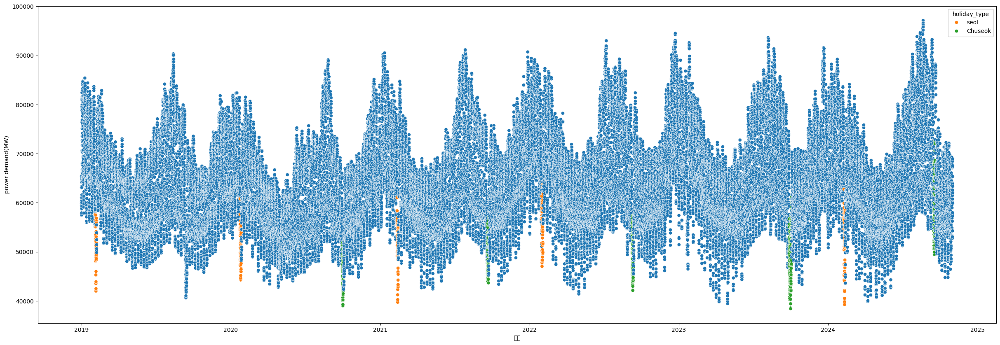

In [12]:
plt.figure(figsize=(30,10))
sns.scatterplot(x = df.index, y = df["power demand(MW)"], hue = df["holiday_type"])

### SARIMAX - 1. 표준화 실시

In [13]:
# hm	ta	power demand(MW) weekday	weekend	spring	summer	autoum	winter
df.reset_index(inplace=True)
df1 = df.groupby("일시")[["hm",	"ta", "power demand(MW)", "weekday", "weekend",	"spring", "summer",	"autoum", "winter"]].mean()

# 외생변수의 표준화 실시
from sklearn.preprocessing import MinMaxScaler
mn = MinMaxScaler()

In [14]:
df.set_index("일시", inplace=True)

df.index = pd.to_datetime(df.index)
df.index = df.index.to_period("H").to_timestamp()

In [15]:
df.drop(["spring", "summer",	"autoum", "winter"], axis=1, inplace=True)

In [16]:
df

,hm,ta,power demand(MW),month,ymd,weekday,weekend,date,holiday_type
일시,,,,,,,,,
2019-01-01 00:00:00,59.705026,-4.174162,65388.0,1,2019-01-01,0,1,weekend,
2019-01-01 01:00:00,60.096649,-4.349947,63045.0,1,2019-01-01,0,1,weekend,
2019-01-01 02:00:00,61.854850,-4.491993,61036.0,1,2019-01-01,0,1,weekend,
2019-01-01 03:00:00,63.020635,-4.648325,59834.0,1,2019-01-01,0,1,weekend,
2019-01-01 04:00:00,63.784303,-4.722354,59491.0,1,2019-01-01,0,1,weekend,
...,...,...,...,...,...,...,...,...,...
2024-10-31 19:00:00,75.547619,15.667637,67551.0,10,2024-10-31,1,0,weekday,
2024-10-31 20:00:00,79.587125,14.787954,65341.0,10,2024-10-31,1,0,weekday,
2024-10-31 21:00:00,82.265079,14.053263,63341.0,10,2024-10-31,1,0,weekday,


In [17]:
train_data

NameError: name 'train_data' is not defined

In [18]:
# 이후 코드로 변수를 1시간 단위 데이터로 쪼개고 접근하기
train_data = df[df.index<="2022-01-01"]
test_data = df[df.index>"2022-01-01"]

train_x = train_data.drop(["power demand(MW)","month", "ymd", "date", "holiday_type"], axis=1)
train_y = train_data["power demand(MW)"]

test_x = test_data.drop(["power demand(MW)","month", "ymd", "date","holiday_type"], axis=1)
test_y = test_data["power demand(MW)"]

# 정규화
from sklearn.preprocessing import MinMaxScaler
mnx = MinMaxScaler()
mny = MinMaxScaler()

scaled_train_x = mnx.fit_transform(train_x)
scaled_train_y = mny.fit_transform(train_y.values.reshape(-1,1))
scaled_test_x = mnx.transform(test_x)
scaled_test_y = mny.transform(test_y.values.reshape(-1,1))

### SARAIMAX 적용

In [39]:
pmd_7 = auto_arima(scaled_train_y, exog = scaled_train_x,
                   d=1,
                   max_p = 4,
                   max_q = 3,
                   m=24, 
                   max_order=8, trace=True)

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[24] intercept   : AIC=-145165.426, Time=277.59 sec
 ARIMA(0,1,0)(0,0,0)[24] intercept   : AIC=-94097.761, Time=6.24 sec
 ARIMA(1,1,0)(1,0,0)[24] intercept   : AIC=inf, Time=90.87 sec
 ARIMA(0,1,1)(0,0,1)[24] intercept   : AIC=-124710.605, Time=96.44 sec
 ARIMA(0,1,0)(0,0,0)[24]             : AIC=-94099.761, Time=1.16 sec
 ARIMA(2,1,2)(0,0,1)[24] intercept   : AIC=-128417.363, Time=212.86 sec
 ARIMA(2,1,2)(1,0,0)[24] intercept   : AIC=-143079.388, Time=191.30 sec
 ARIMA(2,1,2)(2,0,1)[24] intercept   : AIC=-144619.278, Time=978.77 sec
 ARIMA(2,1,2)(1,0,2)[24] intercept   : AIC=-148300.978, Time=898.55 sec
 ARIMA(2,1,2)(0,0,2)[24] intercept   : AIC=-134864.007, Time=691.50 sec
 ARIMA(2,1,2)(2,0,2)[24] intercept   : AIC=inf, Time=868.35 sec
 ARIMA(1,1,2)(1,0,2)[24] intercept   : AIC=inf, Time=763.79 sec


KeyboardInterrupt: 

In [40]:
model = SARIMAX(scaled_train_y, 
                 exog = scaled_train_x, order = (2,1,2), seasonal_order=(1,0,1,24))

model_fit = model.fit()
model_fit.summary()

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -2.42326D+00    |proj g|=  2.36310D+01


 This problem is unconstrained.



At iterate    5    f= -2.71323D+00    |proj g|=  4.42564D-01

At iterate   10    f= -2.72042D+00    |proj g|=  3.86120D+00

At iterate   15    f= -2.72475D+00    |proj g|=  1.12936D+00

At iterate   20    f= -2.72842D+00    |proj g|=  1.47032D-01

At iterate   25    f= -2.74384D+00    |proj g|=  9.14943D-01

At iterate   30    f= -2.74972D+00    |proj g|=  1.75487D-01

At iterate   35    f= -2.75253D+00    |proj g|=  8.19670D-01

At iterate   40    f= -2.75530D+00    |proj g|=  2.65628D-01

At iterate   45    f= -2.75593D+00    |proj g|=  9.97894D-02

At iterate   50    f= -2.75683D+00    |proj g|=  6.75613D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                                    y   No. Observations:                26305
Model:             SARIMAX(2, 1, 2)x(1, 0, [1], 24)   Log Likelihood               72518.474
Date:                              Mon, 10 Mar 2025   AIC                        -145014.949
Time:                                      03:51:48   BIC                        -144924.996
Sample:                                           0   HQIC                       -144985.905
                                            - 26305                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1            -0.0154      0.003     -4.397      0.000      -0.022      -0.009
x2            -0.2757      0.015    -18.058      0.000      -0.306      -0.246
x3            -0.0083      0.000    -18.117      0.000      -0.009      -0.007
x4            -0.0128      0.000    -28.100      0.000      -0.014      -0.012
ar.L1          0.8518      0.011     79.105      0.000       0.831       0.873
ar.L2         -0.5084      0.008    -63.618      0.000      -0.524      -0.493
ma.L1         -0.1618      0.011    -14.695      0.000      -0.183      -0.140
ma.L2          0.4625      0.005     85.842      0.000       0.452       0.473
ar.S.L24       0.9139      0.002    505.764      0.000       0.910       0.917
ma.S.L24      -0.4056      0.005    -85.639      0.000      -0.415      -0.396
sigma2         0.0002   1.75e-06    135.980      0.000       0.000       0.000
===================================================================================
Ljung-Box (L1) (Q):                  46.00   Jarque-Bera (JB):             11725.55
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.99   Skew:                             0.60
Prob(H) (two-sided):                  0.72   Kurtosis:                         6.04
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.76e+17. Standard errors may be unstable.
"""

In [47]:
scaled_test_y.reshape(1,-1)[0]

array([[0.49464923, 0.46252541, 0.44121821, ..., 0.46684055, 0.44171685,
        0.401097  ]])

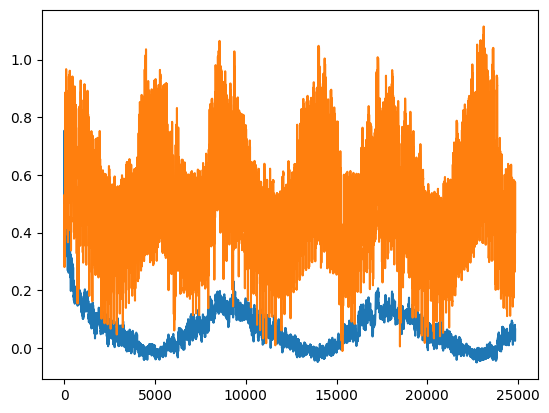

In [234]:
fc = model_fit.get_forecast(steps=len(scaled_test_x), exog=scaled_test_x)
predictions_randomwalk = fc.predicted_mean
confidence_intervals = fc.conf_int()

plt.plot(predictions_randomwalk)
plt.plot(scaled_test_y["power_demand"].values)

# random walk prediction
random_prediction = scaled_test_y["power_demand"].values - predictions_randomwalk

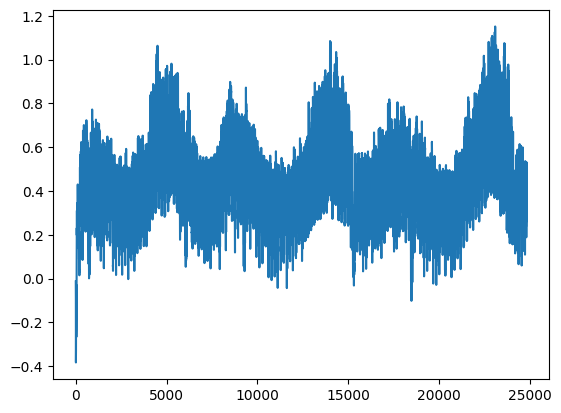

In [241]:
plt.plot(random_prediction)

### 임의보행 모델

In [188]:
model_fit1 = model_fit
import time

In [189]:
scaled_train_x = pd.DataFrame(mnx.fit_transform(train_x), index=train_x.index, columns=train_x.columns)
scaled_train_y = pd.DataFrame(mny.fit_transform(train_y.values.reshape(-1,1)), index=train_y.index, columns=["power_demand"])

scaled_test_x = pd.DataFrame(mnx.transform(test_x), index=test_x.index, columns=test_x.columns)
scaled_test_y = pd.DataFrame(mny.transform(test_y.values.reshape(-1,1)), index=test_y.index, columns=["power_demand"])


print("Walk-forward validation 시작...")

# ✅ 3. Walk-forward validation 실행
predictions = []
n_periods = 24  # 한 번에 예측할 스텝 수
start_time = time.time()

# ✅ 현재 훈련 데이터의 마지막 인덱스 저장
current_last_index = train_y.index[-1]

for i in range(0, len(test_y), n_periods):
    try:
        step = min(n_periods, len(test_y) - i)

        # ✅ 예측 수행 (외생 변수 포함)
        exog_data = scaled_test_x.iloc[i:i+step].copy()
        fc = model_fit1.get_forecast(steps=step, exog=exog_data).predicted_mean
        predictions.extend(fc)

        # ✅ 새로운 종속변수 및 외생변수 준비
        new_endog = scaled_test_y.iloc[i:i+step].copy()
        new_exog = scaled_test_x.iloc[i:i+step].copy()

        # ✅ 새로운 인덱스 생성 (이전 마지막 인덱스 이후 1시간 간격)
        new_index = pd.date_range(
            start=current_last_index + pd.Timedelta(hours=1),
            periods=len(new_endog),
            freq='H'
        )

        # ✅ 인덱스 동기화
        new_endog.index = new_index
        new_exog.index = new_index

        # ✅ 모델 업데이트
        model_fit1 = model_fit1.extend(endog=new_endog, exog=new_exog)

        # ✅ 업데이트 후 현재 마지막 인덱스를 갱신
        current_last_index = new_index[-1]

        # ✅ 진행 상황 출력
        if (i // n_periods + 1) % 100 == 0:
            elapsed_time = time.time() - start_time
            print(f"Processed {i + step}/{len(test_y)} steps in {elapsed_time:.2f} seconds")

    except ValueError as e:
        print(f"Step {i}에서 ValueError 발생: {e}")
        break  # 오류 발생 시 루프 중단

print("Walk-forward validation 완료!")

# ✅ 예측값을 numpy 배열로 변환
predictions = np.array(predictions)

# ✅ 4. 예측값을 원래 스케일로 역변환
predictions_original = mny.inverse_transform(predictions.reshape(-1,1))

# ✅ 결과 확인
print("예측 완료! 최종 예측값 예시:")
print(predictions_original[:5])

Walk-forward validation 시작...
Processed 2400/24839 steps in 1.42 seconds
Processed 4800/24839 steps in 2.73 seconds
Processed 7200/24839 steps in 4.02 seconds
Processed 9600/24839 steps in 5.31 seconds
Processed 12000/24839 steps in 6.61 seconds
Processed 14400/24839 steps in 7.89 seconds
Processed 16800/24839 steps in 9.18 seconds
Processed 19200/24839 steps in 10.47 seconds
Processed 21600/24839 steps in 11.75 seconds
Processed 24000/24839 steps in 13.04 seconds
Walk-forward validation 완료!
예측 완료! 최종 예측값 예시:
[[65465.97753515]
 [64199.39395515]
 [63526.64188278]
 [63807.59176835]
 [65094.42680513]]


In [190]:
scaled_test_y

,power_demand
일시,
2022-01-01 01:00:00,0.494649
2022-01-01 02:00:00,0.462525
2022-01-01 03:00:00,0.441218
2022-01-01 04:00:00,0.436922
2022-01-01 05:00:00,0.443021
...,...
2024-10-31 19:00:00,0.547582
2024-10-31 20:00:00,0.505197
2024-10-31 21:00:00,0.466841


In [191]:
predictions

array([0.50759421, 0.48330317, 0.47040086, ..., 0.43491818, 0.41728252,
       0.38323102])

In [192]:
# 전체 데이터 길이
residual = scaled_test_y["power_demand"].values.reshape(1,-1)[0] - predictions

total_len = len(residual)

# 70% 훈련 데이터, 15% 검증 데이터, 15% 테스트 데이터 비율
train_split = int(total_len * 0.7)
val_split = int(total_len * 0.85)  # 70% + 15%까지 포함

# 데이터 분할
train_residual = residual[:train_split]   # 0 ~ 70%
scaled_train_residual = scaled_test_x[:train_split]

val_residual = residual[train_split:val_split]  # 70% ~ 85%
scaled_val_residual = scaled_test_x[train_split:val_split]

test_residual = residual[val_split:]  # 85% ~ 100%
scaled_test_residual = scaled_test_x[val_split:]

scaled_train_residual1= scaled_train_residual
scaled_val_residual1= scaled_val_residual
scaled_test_residual1= scaled_test_residual

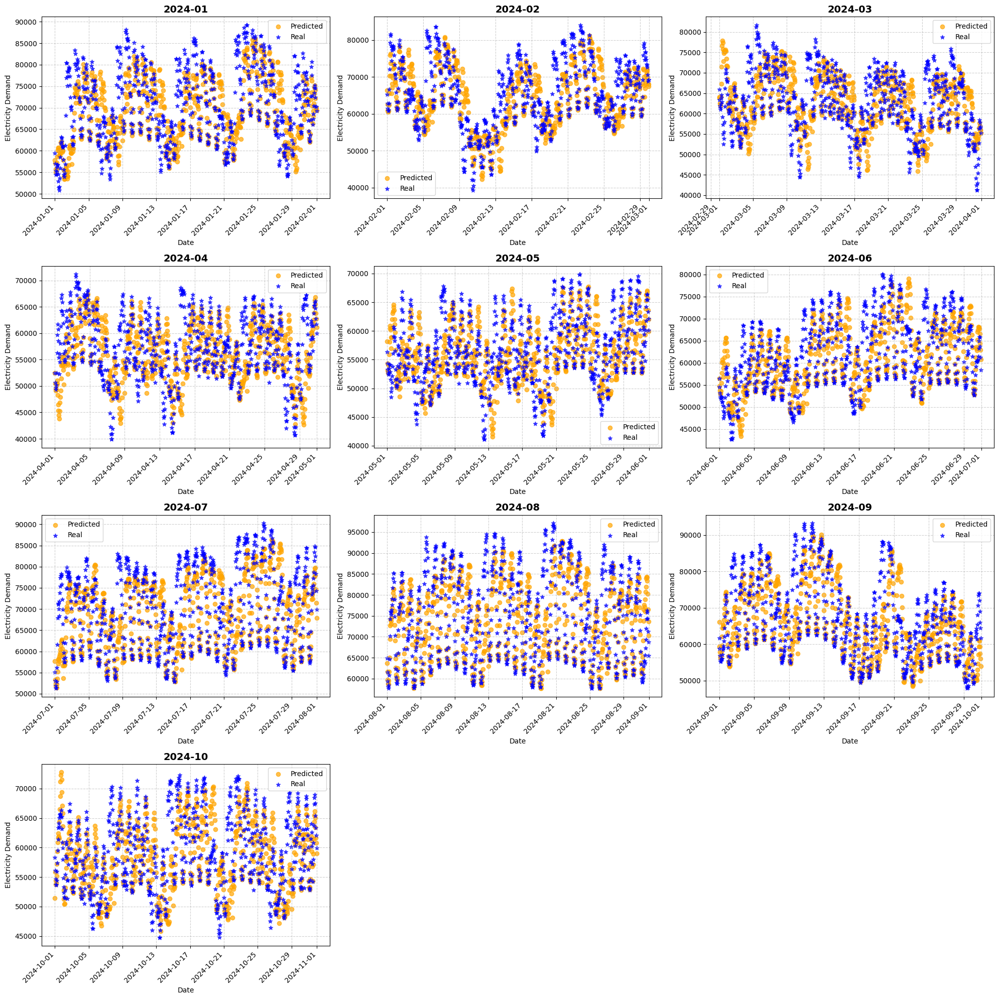

In [193]:
# dataframe 생성 후 인덱스에 맞게 그래프 생성
sarimax_residual_df = pd.DataFrame(predictions, index = test_data.index)
sarimax_residual_df1 = sarimax_residual_df.iloc[train_split:]
real = scaled_test_y[train_split:]

# 역변환 실시
s1 = mny.inverse_transform(sarimax_residual_df)
s2 = mny.inverse_transform(scaled_test_y)

# Dataframe 생성
sarimax_residual_df = pd.DataFrame(s1.flatten()[train_split:], index = sarimax_residual_df1.index)
sarimax_residual_df["s1"] = s2.flatten()[train_split:]
sarimax_test_result = sarimax_residual_df[sarimax_residual_df.index>="2024-01-01 00:00:00"]

# 
sarimax_test_result['year_month'] = sarimax_test_result.index.year.astype(str) + '-' + sarimax_test_result.index.month.astype(str).str.zfill(2)
grouped = sarimax_test_result.groupby('year_month')


# 서브플롯 개수 계산
num_subplots = len(grouped)
rows = (num_subplots // 3) + (num_subplots % 3 > 0)  # 3개씩 배치
cols = min(3, num_subplots)  # 최대 3개씩 가로로 배치

fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))  # 서브플롯 생성
axes = axes.flatten()  # 1차원 배열로 변환

# 각 연월별 플롯 추가
for i, (year_month, group) in enumerate(grouped):
    ax = axes[i]
    ax.scatter(group.index, group[0], color='orange', label="Predicted", alpha=0.7)
    ax.scatter(group.index, group["s1"], color='blue', marker="*", label="Real", alpha=0.7)
    ax.set_title(f'{year_month}', fontsize=14, fontweight='bold')
    ax.set_xlabel('Date')
    ax.set_ylabel('Electricity Demand')
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.legend()
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")  # X축 레이블 회전

# 빈 서브플롯 숨기기
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [194]:
# RMSE, MAPE를 적용한다.
from sklearn.metrics import r2_score, root_mean_squared_error, mean_absolute_percentage_error

print(f"r2_score : {r2_score(s1, s2)}")
print(f"RMSE : {root_mean_squared_error(s1, s2)}")
print(f"MAPE : {mean_absolute_percentage_error(s1, s2)}")

r2_score : 0.5431370848599832
RMSE : 6050.003079176991
MAPE : 0.06254766586915796


In [195]:
import numpy as np

# 슬라이딩 윈도우 함수
def sliding_window(input_data, window_size):
    """
    시계열 데이터를 슬라이딩 윈도우 방식으로 변환하는 함수
    
    Parameters:
    - input_data: numpy array, (samples, features) 형태일 수도 있음
    - window_size: int, 윈도우 크기
    
    Returns:
    - x: numpy array, (samples, window_size, features)
    - y: numpy array, (samples, features)  # 다차원 대응
    """
    
    x = []
    y = []
    
    # 다차원 입력을 고려하여 shape 체크
    if len(input_data.shape) == 1:  # 1D 데이터 (단일 feature)
        input_data = input_data.reshape(-1, 1)  # (samples, 1) 형태로 변환
    
    for i in range(len(input_data) - window_size):
        xx = input_data[i:i + window_size]  # 올바른 윈도우 슬라이싱
        yy = input_data[i + window_size]  # 다음 시점의 값 예측
        
        x.append(xx)
        y.append(yy)
    
    return np.array(x), np.array(y)


In [196]:
train_residual

array([-0.01294499, -0.02077776, -0.02918265, ...,  0.36203639,
        0.34406767,  0.31666037])

In [57]:
train_residual

array([-0.01294499, -0.02077776, -0.02918265, ...,  0.36203639,
        0.34406767,  0.31666037])

In [58]:
resid_train_x, resid_train_y = sliding_window(train_residual, window_size=24)
resid_val_x, resid_val_y = sliding_window( val_residual, window_size=24)
resid_test_x, resid_test_y = sliding_window(test_residual, window_size=24)


# 변수 shape 확인
print(f"train_x shape{resid_train_x.shape}")
print(f"train_x shape{resid_train_y.shape}")
print(f"val_x shape{resid_val_x.shape}")
print(f"val_y shape{resid_val_y.shape}")
print(f"test_x shape{resid_test_x.shape}")
print(f"test_y shape{resid_test_y.shape}")

train_x shape(17363, 24, 1)
train_x shape(17363, 1)
val_x shape(3702, 24, 1)
val_y shape(3702, 1)
test_x shape(3702, 24, 1)
test_y shape(3702, 1)


### LSTM

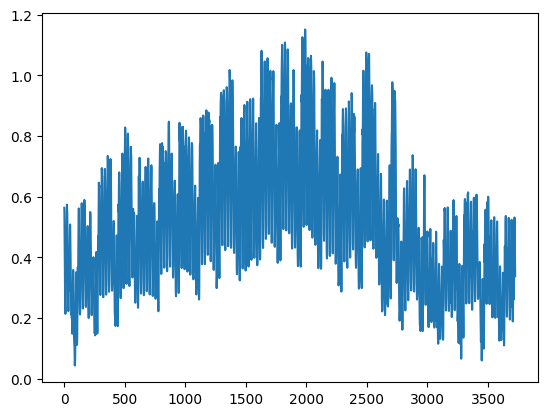

In [277]:
plt.plot(test_residual)

In [245]:
total_len = len(random_prediction)

# 70% 훈련 데이터, 15% 검증 데이터, 15% 테스트 데이터 비율
train_split = int(total_len * 0.7)
val_split = int(total_len * 0.85)  # 70% + 15%까지 포함

# 데이터 분할
train_residual = random_prediction[:train_split]   # 0 ~ 70%
scaled_train_residual = scaled_test_x[:train_split]

val_residual = random_prediction[train_split:val_split]  # 70% ~ 85%
scaled_val_residual = scaled_test_x[train_split:val_split]

test_residual = random_prediction[val_split:]  # 85% ~ 100%
scaled_test_residual = scaled_test_x[val_split:]

scaled_train_residual1= scaled_train_residual
scaled_val_residual1= scaled_val_residual
scaled_test_residual1= scaled_test_residual

In [246]:
# 슬라이딩 윈도우 함수
def sliding_window(input_data, window_size):
    """
    시계열 데이터를 슬라이딩 윈도우 방식으로 변환하는 함수
    
    Parameters:
    - input_data: numpy array, (samples, features) 형태일 수도 있음
    - window_size: int, 윈도우 크기
    
    Returns:
    - x: numpy array, (samples, window_size, features)
    - y: numpy array, (samples, features)  # 다차원 대응
    """
    
    x = []
    y = []
    
    # 다차원 입력을 고려하여 shape 체크
    if len(input_data.shape) == 1:  # 1D 데이터 (단일 feature)
        input_data = input_data.reshape(-1, 1)  # (samples, 1) 형태로 변환
    
    for i in range(len(input_data) - window_size):
        xx = input_data[i:i + window_size]  # 올바른 윈도우 슬라이싱
        yy = input_data[i + window_size]  # 다음 시점의 값 예측
        
        x.append(xx)
        y.append(yy)
    
    return np.array(x), np.array(y)


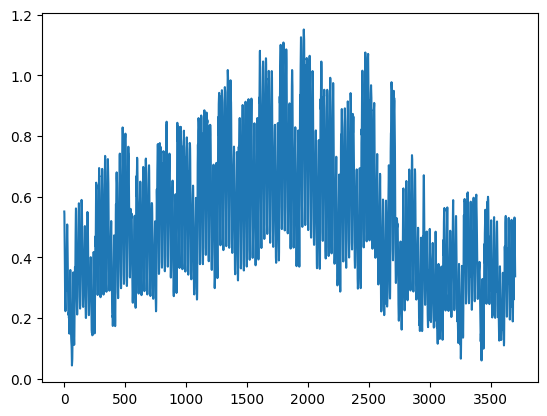

In [263]:
plt.plot(resid_test_y)

In [247]:
resid_train_x, resid_train_y = sliding_window(train_residual, window_size=24)
resid_val_x, resid_val_y = sliding_window(val_residual, window_size=24)
resid_test_x, resid_test_y = sliding_window(test_residual, window_size=24)


# 변수 shape 확인
print(f"train_x shape{resid_train_x.shape}")
print(f"train_x shape{resid_train_y.shape}")
print(f"val_x shape{resid_val_x.shape}")
print(f"val_y shape{resid_val_y.shape}")
print(f"test_x shape{resid_test_x.shape}")
print(f"test_y shape{resid_test_y.shape}")

train_x shape(17363, 24, 1)
train_x shape(17363, 1)
val_x shape(3702, 24, 1)
val_y shape(3702, 1)
test_x shape(3702, 24, 1)
test_y shape(3702, 1)


In [264]:
#############################################
# 1. LSTM 모델 정의
#############################################
class LSTM_Model(nn.Module):
    def __init__(self, lstm_layers, dense_layers, units, dense_units, lstm_dropout_rate, 
                 dense_dropout_rate, input_features):
        super(LSTM_Model, self).__init__()
        
        # LSTM 레이어
        self.lstm = nn.LSTM(
                input_size=input_features,
                hidden_size=units, 
                num_layers=lstm_layers, 
                batch_first=True
                )
        self.lstm_dropout = nn.Dropout(lstm_dropout_rate)  # LSTM 출력에 Dropout 적용

        
        # Dense 레이어 (dense_layers가 0이면 바로 출력)
        self.dense_layers = nn.ModuleList(
            [nn.Sequential(
                nn.Linear(units if i == 0 else dense_units, dense_units),
                nn.ReLU(),
                nn.Dropout(dense_dropout_rate)
            ) for i in range(dense_layers)]
        )
        
        # 출력 레이어
        self.output_layer = nn.Linear(dense_units if dense_layers > 0 else units, 1)
        
    def forward(self, x):
        # LSTM 적용: 마지막 타임스텝의 출력을 사용
        x, _ = self.lstm(x)
        x = x[:, -1, :]
        # Dense 레이어 적용
        for layer in self.dense_layers:
            x = layer(x)
        # 출력 레이어
        x = self.output_layer(x)
        return x

#############################################
# 2. DataLoader 생성 함수
#############################################

def create_dataloader(X, Y, batch_size):
    dataset = TensorDataset(torch.tensor(X, dtype=torch.float32), torch.tensor(Y, dtype=torch.float32))
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False, num_workers=0)
    return dataloader

#############################################
# 3. Fitness 함수 (LSTM 하이퍼파라미터 최적화 대상)
#############################################

def fitness_function(params, X_train, Y_train, X_val, Y_val, device):
    # 파라미터 순서: [lstm_layers, dense_layers, units, dense_units, learning_rate, lstm_dropout_rate, dense_dropout_rate, batch_size]
    (lstm_layers, dense_layers, units, dense_units, learning_rate, 
     lstm_dropout_rate, dense_dropout_rate, batch_size) = (
        int(params[0]), int(params[1]), int(params[2]), int(params[3]),
        params[4], params[5], params[6], int(params[7])
    )
    
    input_features = X_train.shape[2]
    model = LSTM_Model(
        lstm_layers=lstm_layers,
        dense_layers=dense_layers,
        units=units,
        dense_units=dense_units,
        lstm_dropout_rate=lstm_dropout_rate,
        dense_dropout_rate=dense_dropout_rate,
        input_features=input_features
    ).to(device)
    
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    train_loader = create_dataloader(X_train, Y_train, batch_size)
    
    model.train()
    # 짧은 에폭 동안 훈련 (예: 50 epoch)
    for epoch in range(50):
        for batch_X, batch_Y in train_loader:
            batch_X, batch_Y = batch_X.to(device), batch_Y.to(device)
            optimizer.zero_grad()
            predictions = model(batch_X)
            loss = criterion(predictions, batch_Y)
            loss.backward()
            optimizer.step()
    
    model.eval()
    with torch.no_grad():
        X_val_tensor = torch.tensor(X_val, dtype=torch.float32).to(device)
        Y_val_tensor = torch.tensor(Y_val, dtype=torch.float32).to(device)
        val_predictions = model(X_val_tensor)
        val_loss = criterion(val_predictions, Y_val_tensor).item()
    return val_loss

#############################################
# 4. 보조 함수: Bounds, swapfun
#############################################

def Bounds(s, Lb, Ub):
    temp = s.copy()
    for i in range(len(s)):
        if temp[i] < Lb[0, i]:
            temp[i] = Lb[0, i]
        elif temp[i] > Ub[0, i]:
            temp[i] = Ub[0, i]
    return temp

def swapfun(ss):
    o = np.zeros((1, len(ss)))
    for i in range(len(ss)):
        o[0, i] = ss[i]
    return o

#############################################
# 5. 수정된 DBO 함수 (벡터 하한/상한 사용)
#############################################

def DBO(pop, M, lb_vector, ub_vector, dim, fun):
    """
    :param pop: 인구수
    :param M: 반복 횟수 (세대 수)
    :param lb_vector: 각 차원의 하한을 담은 배열 (shape=(dim,))
    :param ub_vector: 각 차원의 상한을 담은 배열 (shape=(dim,))
    :param dim: 최적화할 차원 수 (여기서는 8)
    :param fun: fitness 함수 (최소화 대상)
    :return: 최적 fitness, 최적 파라미터, 수렴 곡선
    """
    lb = lb_vector.reshape(1, dim)
    ub = ub_vector.reshape(1, dim)
    
    P_percent = 0.2
    pNum = round(pop * P_percent)
    X = np.zeros((pop, dim))
    fit = np.zeros((pop, 1))
    
    for i in range(pop):
        X[i, :] = lb + (ub - lb) * np.random.rand(1, dim)
        fit[i, 0] = fun(X[i, :])
    
    pFit = fit.copy()
    pX = X.copy()
    XX = pX.copy()
    fMin = np.min(fit[:, 0])
    bestI = np.argmin(fit[:, 0])
    bestX = X[bestI, :].copy()
    Convergence_curve = np.zeros((1, M))
    
    for t in range(M):
        fmax = np.max(pFit[:, 0])
        B = np.argmax(pFit[:, 0])
        worse = X[B, :].copy()  # 현재 최악 해
        
        r2 = np.random.rand(1)
        for i in range(pNum):
            if r2 < 0.9:
                r1 = np.random.rand(1)
                a = np.random.rand(1)
                a = 1 if a > 0.1 else -1
                X[i, :] = pX[i, :] + 0.3 * np.abs(pX[i, :] - worse) + a * 0.1 * (XX[i, :])
            else:
                aaa = np.random.randint(0, 180, size=1)
                if aaa in [0, 90, 180]:
                    X[i, :] = pX[i, :]
                else:
                    theta = aaa * math.pi / 180
                    X[i, :] = pX[i, :] + math.tan(theta) * np.abs(pX[i, :] - XX[i, :])
            X[i, :] = Bounds(X[i, :], lb, ub)
            fit[i, 0] = fun(X[i, :])
        
        bestII = np.argmin(fit[:, 0])
        bestXX = X[bestII, :].copy()
        
        R = 1 - t / M
        Xnew1 = bestXX * (1 - R)
        Xnew2 = bestXX * (1 + R)
        Xnew1 = Bounds(Xnew1, lb, ub)
        Xnew2 = Bounds(Xnew2, lb, ub)
        Xnew11 = bestX * (1 - R)
        Xnew22 = bestX * (1 + R)
        Xnew11 = Bounds(Xnew11, lb, ub)
        Xnew22 = Bounds(Xnew22, lb, ub)
        
        for i in range(pNum+1, min(12, pop)):
            rand1 = np.random.rand(1, dim)
            rand2 = np.random.rand(1, dim)
            X[i, :] = bestXX + rand1 * (pX[i, :] - Xnew1) + rand2 * (pX[i, :] - Xnew2)
            X[i, :] = Bounds(X[i, :], Xnew1, Xnew2)
            fit[i, 0] = fun(X[i, :])
        
        for i in range(13, min(19, pop)):
            X[i, :] = pX[i, :] + (np.random.randn(1) * (pX[i, :] - Xnew11) +
                                  np.random.rand(1, dim) * (pX[i, :] - Xnew22))
            X[i, :] = Bounds(X[i, :], lb, ub)
            fit[i, 0] = fun(X[i, :])
        
        for j in range(20, pop):
            X[j, :] = bestX + np.random.randn(1, dim) * (np.abs(pX[j, :] - bestXX) +
                                                         np.abs(pX[j, :] - bestX)) / 2
            X[j, :] = Bounds(X[j, :], lb, ub)
            fit[j, 0] = fun(X[j, :])
        
        # 업데이트: 개선된 해 저장
        XX = pX.copy()
        for i in range(pop):
            if fit[i, 0] < pFit[i, 0]:
                pFit[i, 0] = fit[i, 0]
                pX[i, :] = X[i, :].copy()
            if pFit[i, 0] < fMin:
                fMin = pFit[i, 0]
                bestX = pX[i, :].copy()

                # 최적 파라미터 출력
                print(f"New Best Fitness: {fMin:.6f}, Best Parameters: {bestX}")

        Convergence_curve[0, t] = fMin
        print(f"Iteration {t+1}, Best Fitness: {fMin:.6f}")
        
    return fMin, bestX, Convergence_curve


def train_model(X_train, Y_train, X_val, Y_val, X_test, Y_test, best_params, device):
    # best_params 순서: 
    # [lstm_layers, dense_layers, units, dense_units, learning_rate, lstm_dropout_rate, dense_dropout_rate, batch_size]
    lstm_layers, dense_layers, units, dense_units, learning_rate, lstm_dropout_rate, dense_dropout_rate, batch_size = (
        int(best_params[0]), int(best_params[1]), int(best_params[2]), int(best_params[3]),
        best_params[4], best_params[5], best_params[6], int(best_params[7])
    )
    
    input_features = X_train.shape[2]
    model = LSTM_Model(
        lstm_layers=lstm_layers,
        dense_layers=dense_layers,
        units=units,
        dense_units=dense_units,
        lstm_dropout_rate=lstm_dropout_rate,
        dense_dropout_rate=dense_dropout_rate,
        input_features=input_features
    ).to(device)
    
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    # DataLoader 생성
    train_loader = create_dataloader(X_train, Y_train, batch_size)
    val_loader = create_dataloader(X_val, Y_val, batch_size)
    test_loader = create_dataloader(X_test, Y_test, batch_size)
    
    train_losses = []
    val_losses = []
    epochs = 50  # 최종 모델 학습 에폭 수
    
    # Training & Validation loop
    for epoch in range(epochs):
        model.train()
        epoch_train_loss = 0.0
        for batch_X, batch_Y in train_loader:
            batch_X, batch_Y = batch_X.to(device), batch_Y.to(device)
            optimizer.zero_grad()
            preds = model(batch_X)
            loss = criterion(preds, batch_Y)
            loss.backward()
            optimizer.step()
            epoch_train_loss += loss.item()
        train_losses.append(epoch_train_loss / len(train_loader))
        
        model.eval()
        epoch_val_loss = 0.0
        with torch.no_grad():
            for batch_X, batch_Y in val_loader:
                batch_X, batch_Y = batch_X.to(device), batch_Y.to(device)
                preds = model(batch_X)
                loss = criterion(preds, batch_Y)
                epoch_val_loss += loss.item()
        val_losses.append(epoch_val_loss / len(val_loader))
        
        if (epoch + 1) % 10 == 0:
            print(f"Epoch [{epoch+1}/{epochs}], Train Loss: {train_losses[-1]:.4f}, Val Loss: {val_losses[-1]:.4f}")
    
    print("Final model training complete.")
    
    # Test evaluation
    model.eval()
    test_loss = 0.0
    test_preds = []
    with torch.no_grad():
        for batch_X, batch_Y in test_loader:
            batch_X, batch_Y = batch_X.to(device), batch_Y.to(device)
            preds = model(batch_X)
            loss = criterion(preds, batch_Y)
            test_loss += loss.item()
            test_preds.append(preds.cpu().numpy())
            
    test_loss /= len(test_loader)
    test_preds = np.concatenate(test_preds, axis=0)
    
    return model, train_losses, val_losses, test_loss, test_preds

In [94]:
if __name__ == '__main__':
    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    # 하이퍼파라미터 범위 설정
    lb_params = np.array([1, 1, 10, 100, 0.0001, 0.1, 0.1, 16])
    ub_params = np.array([2, 3, 100, 300, 0.01, 0.5, 0.5, 256])
    pop = 20   # 개체 수
    M = 5      # 반복 횟수
    
    # DBO 실행
    # ✅ DBO 호출 방식 수정 (lambda에서 모든 인자를 전달)
    best_loss, best_params, convergence = DBO(
    pop, M, lb_params, ub_params, 8,
    lambda params: fitness_function(params, resid_train_x, resid_train_y, 
                                    resid_val_x, resid_val_y, device)
)

    print("최적 검증 손실:", best_loss)

    print("최적 하이퍼파라미터:", best_params)

    # 최적 모델 학습 및 평가
    final_model, train_losses, val_losses, test_loss, test_preds = train_model(
        resid_train_x, resid_train_y, resid_val_x, resid_val_x, best_params, device
    )

    print("최종 모델 학습 후 Validation Loss:", val_losses[-1])
    print("테스트 데이터 손실:", test_loss)

KeyboardInterrupt: 

In [249]:
# test_val merge 후 검정
val_test_data = np.concatenate((val_residual, test_residual))
val_test_data

# 슬라이딩 윈도우 적용
val_test_x , val_test_y = sliding_window(val_test_data, 24)

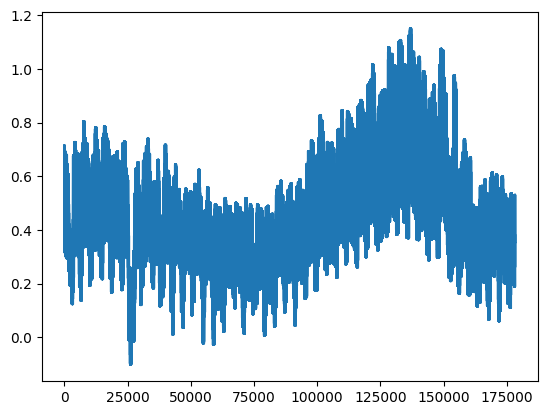

In [250]:
plt.plot(val_test_x.flatten())

In [273]:
if __name__ == '__main__':
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    
    best_params = [1.27511906e+00, 1.14609755e+00, 8.00000000e+01, 100,
 5.69123530e-03, 5.00000000e-01, 2.10124718e-01, 2.54087576e+02]
    # 최적 하이퍼파라미터를 이용해 모델 학습 및 평가
    final_model, train_losses, val_losses, test_loss, test_preds = train_model(
        resid_train_x, resid_train_y , resid_val_x, resid_val_y, val_test_x , val_test_y, best_params, device
    )

    print("최종 모델 학습 후 Validation Loss:", val_losses[-1])
    print("테스트 데이터 손실:", test_loss)

Epoch [10/50], Train Loss: 0.0024, Val Loss: 0.0014
Epoch [20/50], Train Loss: 0.0022, Val Loss: 0.0014
Epoch [30/50], Train Loss: 0.0019, Val Loss: 0.0009
Epoch [40/50], Train Loss: 0.0018, Val Loss: 0.0007
Epoch [50/50], Train Loss: 0.0018, Val Loss: 0.0007
Final model training complete.
최종 모델 학습 후 Validation Loss: 0.0006620734619597594
테스트 데이터 손실: 0.0009803724979671339


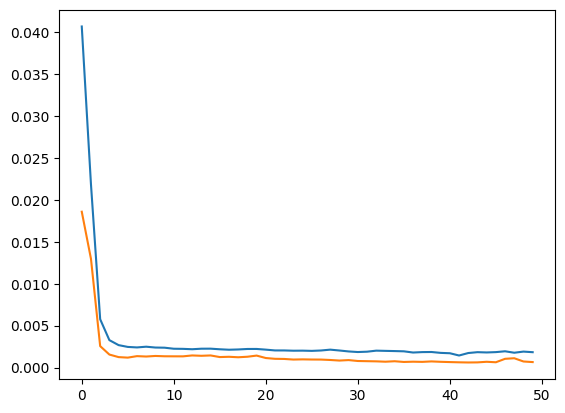

In [274]:
plt.plot(train_losses) 
plt.plot(val_losses)

In [302]:
len(test_preds.flatten())

7428

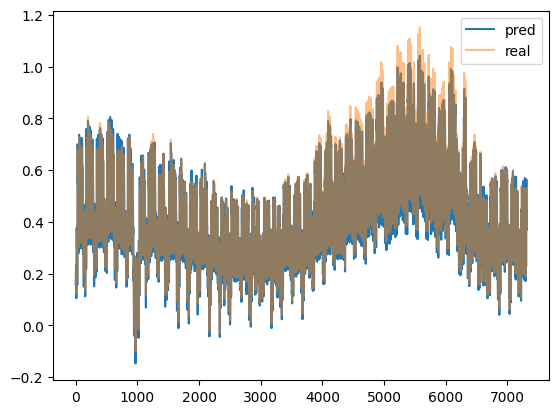

In [374]:
plt.plot(test_preds.flatten()[-7317:-1], label = "pred")
plt.plot(random_prediction[-7317:-1], alpha=0.5, label = "real")
plt.legend()

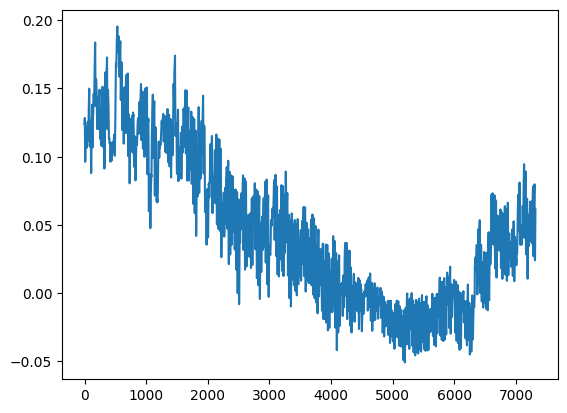

In [388]:
plt.plot(predictions_randomwalk[-7317:-1])

In [389]:
sarimax_lstm = predictions_randomwalk[-7317:-1] + test_preds.flatten()[-7317:-1]
sarimax_lstm_inverse = mny.inverse_transform(sarimax_lstm.reshape(-1,1))

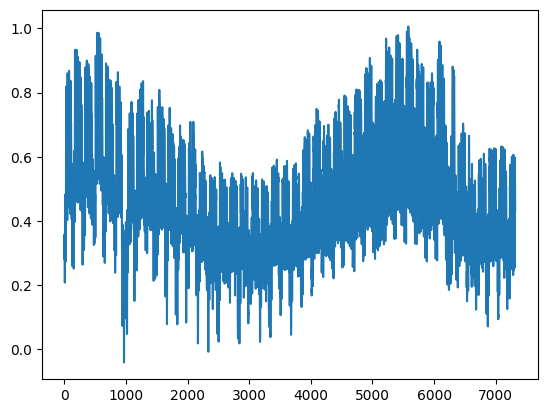

In [390]:
plt.plot(sarimax_lstm)

In [391]:
len(sadas)

7314

In [392]:
sarimax_test_result_index = sarimax_test_result[-7315:-1].index

sadas = pd.DataFrame(sarimax_lstm_inverse[-7315:-1])
sadas.index = sarimax_test_result_index

In [394]:
from sklearn.metrics import r2_score, root_mean_squared_error, mean_absolute_percentage_error

print(f"r2_score : {r2_score(test_y[-7315:-1], sadas)}")
print(f"RMSE : {root_mean_squared_error(test_y[-7315:-1], sadas)}")
print(f"MAPE : {mean_absolute_percentage_error(sadas, test_y[-7315:-1])}")

r2_score : 0.9089663605234389
RMSE : 3128.4393224640626
MAPE : 0.038903541900361986


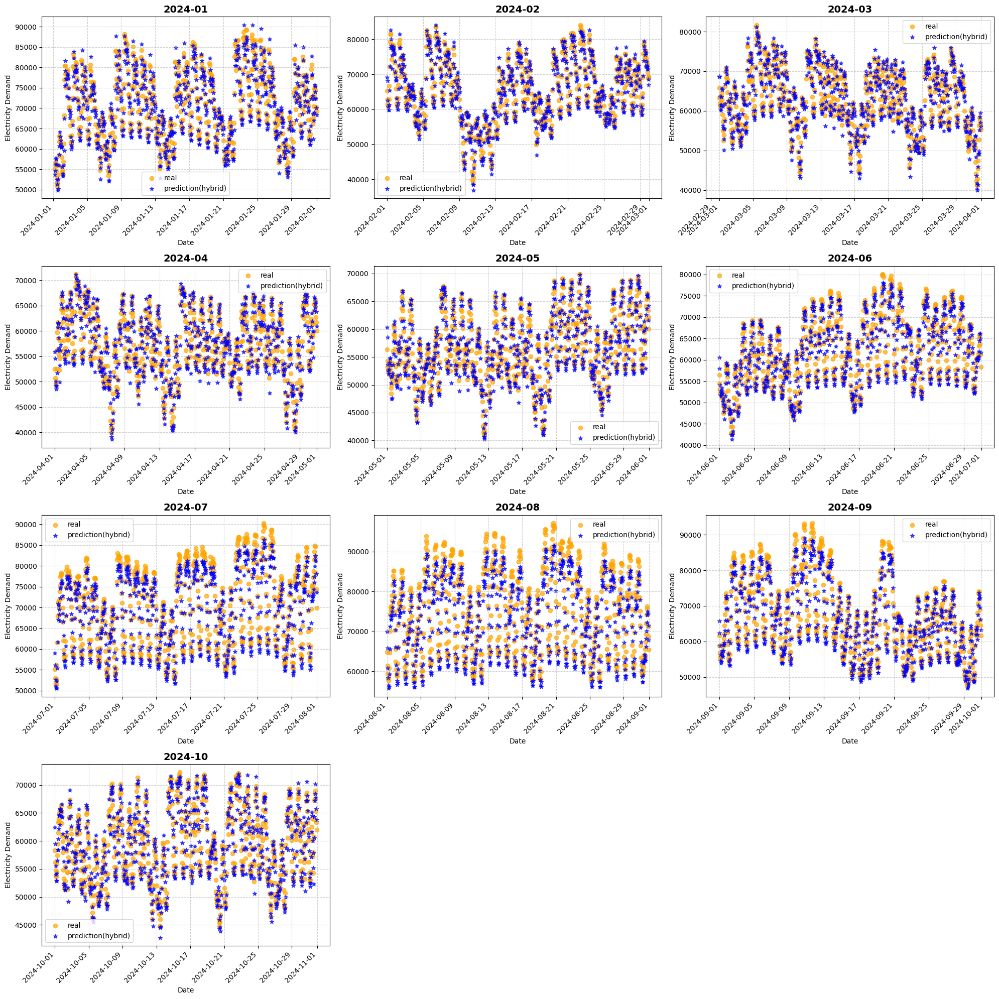

In [396]:
# 변수 : test_y[-7317:-1], sadas

# Dataframe 생성
sarimax_lstm = pd.DataFrame(test_y[-7315:-1])
sarimax_lstm["pred"] = sadas

# 
sarimax_lstm['year_month'] = sarimax_lstm.index.strftime('%Y-%m')
grouped = sarimax_lstm.groupby('year_month')

# 서브플롯 개수 계산
num_subplots = len(grouped)
rows = (num_subplots // 3) + (num_subplots % 3 > 0)  # 3개씩 배치
cols = min(3, num_subplots)  # 최대 3개씩 가로로 배치

fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))  # 서브플롯 생성
axes = axes.flatten()  # 1차원 배열로 변환

# 각 연월별 플롯 추가
for i, (year_month, group) in enumerate(grouped):
    ax = axes[i]
    ax.scatter(group.index, group["power demand(MW)"], color='orange', label="real", alpha=0.7)
    ax.scatter(group.index, group["pred"], color='blue', marker="*", label="prediction(hybrid)", alpha=0.7)
    ax.scatter(group.index, group["pred"], color='blue', marker="*", label="prediction(hybrid)", alpha=0.7)
    ax.set_title(f'{year_month}', fontsize=14, fontweight='bold')
    ax.set_xlabel('Date')
    ax.set_ylabel('Electricity Demand')
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.legend()
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")  # X축 레이블 회전

# 빈 서브플롯 숨기기
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

### LSTM 적용

In [19]:
# 전체 데이터 길이 계산
total_len = len(df)

# 데이터 분할 지점 설정
train_split = int(total_len * 0.7)  # 70% 훈련 데이터
val_split = int(total_len * 0.85)  # 70% + 15% = 85%, 검증 데이터 끝 지점

# 표준화
mnx = MinMaxScaler()
mny = MinMaxScaler()

# "hm", "ta","weekday", "weekend",	"spring", "summer",	"autoum", "winter"
train_x = df[["hm", "ta","weekday", "weekend"]][:train_split]
train_y = df["power demand(MW)"][:train_split]

val_x = df[["hm", "ta","weekday", "weekend"]][train_split:val_split]
val_y = df["power demand(MW)"][train_split:val_split]

test_x = df[["hm", "ta","weekday", "weekend"]][val_split:]
test_y = df["power demand(MW)"][val_split:]

# 표준화
train_scaled_x = mnx.fit_transform(train_x)
train_scaled_y = mny.fit_transform(train_y.values.reshape(-1,1))

val_scaled_x = mnx.transform(val_x)
val_scaled_y = mny.transform(val_y.values.reshape(-1,1))

test_scaled_x = mnx.transform(test_x)
test_scaled_y = mny.transform(test_y.values.reshape(-1,1))

In [21]:
def sliding_window(input_data, target_data , window_size):
    """
    시계열 데이터를 슬라이딩 윈도우 방식으로 변환하는 함수
    
    Parameters:
    - input_data: numpy array, (samples, features) 형태일 수도 있음
    - window_size: int, 윈도우 크기
    
    Returns:
    - x: numpy array, (samples, window_size, features)
    - y: numpy array, (samples, features)  # 다차원 대응
    """
    
    x = []
    y = []
    
    # 다차원 입력을 고려하여 shape 체크
    if len(input_data.shape) == 1:  # 1D 데이터 (단일 feature)
        input_data = input_data.reshape(-1, 1)  # (samples, 1) 형태로 변환
    
    for i in range(len(input_data) - window_size):
        xx = input_data[i:i + window_size]  # 올바른 윈도우 슬라이싱
        yy = target_data[i + window_size]  # 다음 시점의 값 예측
        
        x.append(xx)
        y.append(yy)
    
    return np.array(x), np.array(y)

In [22]:
# 데이터 분할 (시간 순서 유지)
train_x, train_y = sliding_window(train_scaled_x, train_scaled_y, window_size=24)
val_x, val_y = sliding_window(val_scaled_x, val_scaled_y, window_size=24)
test_x, test_y = sliding_window(test_scaled_x, test_scaled_y, window_size=24)


print("\n✅ Final dataset shapes:")
print(f"Training set   → X: {train_x.shape}, Y: {train_y.shape}")
print(f"Validation set → X: {val_x.shape}, Y: {val_y.shape}")
print(f"Test set       → X: {test_x.shape}, Y: {test_y.shape}")


✅ Final dataset shapes:
Training set   → X: (35776, 24, 4), Y: (35776, 1)
Validation set → X: (7648, 24, 4), Y: (7648, 1)
Test set       → X: (7648, 24, 4), Y: (7648, 1)


In [46]:
#############################################
# 1. LSTM 모델 정의
#############################################
class LSTM_Model(nn.Module):
    def __init__(self, lstm_layers, dense_layers, units, dense_units, lstm_dropout_rate, 
                 dense_dropout_rate, input_features):
        super(LSTM_Model, self).__init__()
        
        # LSTM 레이어
        self.lstm = nn.LSTM(
                input_size=input_features,
                hidden_size=units, 
                num_layers=lstm_layers, 
                batch_first=True
                )
        self.lstm_dropout = nn.Dropout(lstm_dropout_rate)  # LSTM 출력에 Dropout 적용

        
        # Dense 레이어 (dense_layers가 0이면 바로 출력)
        self.dense_layers = nn.ModuleList(
            [nn.Sequential(
                nn.Linear(units if i == 0 else dense_units, dense_units),
                nn.ReLU(),
                nn.Dropout(dense_dropout_rate)
            ) for i in range(dense_layers)]
        )
        
        # 출력 레이어
        self.output_layer = nn.Linear(dense_units if dense_layers > 0 else units, 1)
        
    def forward(self, x):
        # LSTM 적용: 마지막 타임스텝의 출력을 사용
        x, _ = self.lstm(x)
        x = x[:, -1, :]
        # Dense 레이어 적용
        for layer in self.dense_layers:
            x = layer(x)
        # 출력 레이어
        x = self.output_layer(x)
        return x

#############################################
# 2. DataLoader 생성 함수
#############################################

def create_dataloader(X, Y, batch_size):
    dataset = TensorDataset(torch.tensor(X, dtype=torch.float32), torch.tensor(Y, dtype=torch.float32))
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False, num_workers=0)
    return dataloader

#############################################
# 3. Fitness 함수 (LSTM 하이퍼파라미터 최적화 대상)
#############################################

def fitness_function(params, X_train, Y_train, X_val, Y_val, device):
    # 파라미터 순서: [lstm_layers, dense_layers, units, dense_units, learning_rate, lstm_dropout_rate, dense_dropout_rate, batch_size]
    (lstm_layers, dense_layers, units, dense_units, learning_rate, 
     lstm_dropout_rate, dense_dropout_rate, batch_size) = (
        int(params[0]), int(params[1]), int(params[2]), int(params[3]),
        params[4], params[5], params[6], int(params[7])
    )
    
    input_features = X_train.shape[2]
    model = LSTM_Model(
        lstm_layers=lstm_layers,
        dense_layers=dense_layers,
        units=units,
        dense_units=dense_units,
        lstm_dropout_rate=lstm_dropout_rate,
        dense_dropout_rate=dense_dropout_rate,
        input_features=input_features
    ).to(device)
    
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    train_loader = create_dataloader(X_train, Y_train, batch_size)
    
    model.train()
    # 짧은 에폭 동안 훈련 (예: 50 epoch)
    for epoch in range(50):
        for batch_X, batch_Y in train_loader:
            batch_X, batch_Y = batch_X.to(device), batch_Y.to(device)
            optimizer.zero_grad()
            predictions = model(batch_X)
            loss = criterion(predictions, batch_Y)
            loss.backward()
            optimizer.step()
    
    model.eval()
    with torch.no_grad():
        X_val_tensor = torch.tensor(X_val, dtype=torch.float32).to(device)
        Y_val_tensor = torch.tensor(Y_val, dtype=torch.float32).to(device)
        val_predictions = model(X_val_tensor)
        val_loss = criterion(val_predictions, Y_val_tensor).item()
    return val_loss

#############################################
# 4. 보조 함수: Bounds, swapfun
#############################################
import math
def Bounds(s, Lb, Ub):
    return np.minimum(np.maximum(s, Lb), Ub)  # ✅ NumPy 벡터 연산 활용


def swapfun(ss):
    o = np.zeros((1, len(ss)))
    for i in range(len(ss)):
        o[0, i] = ss[i]
    return o

#############################################
# 5. 수정된 DBO 함수 (벡터 하한/상한 사용)
#############################################

def DBO(pop, M, lb_vector, ub_vector, dim, fun):
    """
    :param pop: 인구수
    :param M: 반복 횟수 (세대 수)
    :param lb_vector: 각 차원의 하한을 담은 배열 (shape=(dim,))
    :param ub_vector: 각 차원의 상한을 담은 배열 (shape=(dim,))
    :param dim: 최적화할 차원 수 (여기서는 8)
    :param fun: fitness 함수 (최소화 대상)
    :return: 최적 fitness, 최적 파라미터, 수렴 곡선
    """
    lb = lb_vector.reshape(1, dim)
    ub = ub_vector.reshape(1, dim)
    
    P_percent = 0.2
    pNum = round(pop * P_percent)
    X = np.zeros((pop, dim))
    fit = np.zeros((pop, 1))
    
    for i in range(pop):
        X[i, :] = lb + (ub - lb) * np.random.rand(1, dim)
        fit[i, 0] = fun(X[i, :])
    
    pFit = fit.copy()
    pX = X.copy()
    XX = pX.copy()
    fMin = np.min(fit[:, 0])
    bestI = np.argmin(fit[:, 0])
    bestX = X[bestI, :].copy()
    Convergence_curve = np.zeros((1, M))
    
    for t in range(M):
        fmax = np.max(pFit[:, 0])
        B = np.argmax(pFit[:, 0])
        worse = X[B, :].copy()  # 현재 최악 해
        
        r2 = np.random.rand(1)
        for i in range(pNum):
            if r2 < 0.9:
                r1 = np.random.rand(1)
                a = np.random.rand(1)
                a = 1 if a > 0.1 else -1
                X[i, :] = pX[i, :] + 0.3 * np.abs(pX[i, :] - worse) + a * 0.1 * (XX[i, :])
            else:
                aaa = np.random.randint(0, 180, size=1)
                if aaa in [0, 90, 180]:
                    X[i, :] = pX[i, :]
                else:
                    theta = aaa * math.pi / 180
                    X[i, :] = pX[i, :] + math.tan(theta) * np.abs(pX[i, :] - XX[i, :])
            X[i, :] = Bounds(X[i, :], lb, ub)
            fit[i, 0] = fun(X[i, :])
        
        bestII = np.argmin(fit[:, 0])
        bestXX = X[bestII, :].copy()
        
        R = 1 - t / M
        Xnew1 = bestXX * (1 - R)
        Xnew2 = bestXX * (1 + R)
        Xnew1 = Bounds(Xnew1, lb, ub)
        Xnew2 = Bounds(Xnew2, lb, ub)
        Xnew11 = bestX * (1 - R)
        Xnew22 = bestX * (1 + R)
        Xnew11 = Bounds(Xnew11, lb, ub)
        Xnew22 = Bounds(Xnew22, lb, ub)
        
        for i in range(pNum+1, min(12, pop)):
            rand1 = np.random.rand(1, dim)
            rand2 = np.random.rand(1, dim)
            X[i, :] = bestXX + rand1 * (pX[i, :] - Xnew1) + rand2 * (pX[i, :] - Xnew2)
            X[i, :] = Bounds(X[i, :], Xnew1, Xnew2)
            fit[i, 0] = fun(X[i, :])
        
        for i in range(13, min(19, pop)):
            X[i, :] = pX[i, :] + (np.random.randn(1) * (pX[i, :] - Xnew11) +
                                  np.random.rand(1, dim) * (pX[i, :] - Xnew22))
            X[i, :] = Bounds(X[i, :], lb, ub)
            fit[i, 0] = fun(X[i, :])
        
        for j in range(20, pop):
            X[j, :] = bestX + np.random.randn(1, dim) * (np.abs(pX[j, :] - bestXX) +
                                                         np.abs(pX[j, :] - bestX)) / 2
            X[j, :] = Bounds(X[j, :], lb, ub)
            fit[j, 0] = fun(X[j, :])
        
        # 업데이트: 개선된 해 저장
        XX = pX.copy()
        for i in range(pop):
            if fit[i, 0] < pFit[i, 0]:
                pFit[i, 0] = fit[i, 0]
                pX[i, :] = X[i, :].copy()
            if pFit[i, 0] < fMin:
                fMin = pFit[i, 0]
                bestX = pX[i, :].copy()

                # 최적 파라미터 출력
                print(f"New Best Fitness: {fMin:.6f}, Best Parameters: {bestX}")

        Convergence_curve[0, t] = fMin
        print(f"Iteration {t+1}, Best Fitness: {fMin:.6f}")
        
    return fMin, bestX, Convergence_curve


def train_model(X_train, Y_train, X_val, Y_val, X_test, Y_test, best_params, device):
    # best_params 순서: 
    # [lstm_layers, dense_layers, units, dense_units, learning_rate, lstm_dropout_rate, dense_dropout_rate, batch_size]
    lstm_layers, dense_layers, units, dense_units, learning_rate, lstm_dropout_rate, dense_dropout_rate, batch_size = (
        int(best_params[0]), int(best_params[1]), int(best_params[2]), int(best_params[3]),
        best_params[4], best_params[5], best_params[6], int(best_params[7])
    )
    
    input_features = X_train.shape[2]
    model = LSTM_Model(
        lstm_layers=lstm_layers,
        dense_layers=dense_layers,
        units=units,
        dense_units=dense_units,
        lstm_dropout_rate=lstm_dropout_rate,
        dense_dropout_rate=dense_dropout_rate,
        input_features=input_features
    ).to(device)
    
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    # DataLoader 생성
    train_loader = create_dataloader(X_train, Y_train, batch_size)
    val_loader = create_dataloader(X_val, Y_val, batch_size)
    test_loader = create_dataloader(X_test, Y_test, batch_size)
    
    train_losses = []
    val_losses = []
    epochs = 150  # 최종 모델 학습 에폭 수
    
    # Training & Validation loop
    for epoch in range(epochs):
        model.train()
        epoch_train_loss = 0.0
        for batch_X, batch_Y in train_loader:
            batch_X, batch_Y = batch_X.to(device), batch_Y.to(device)
            optimizer.zero_grad()
            preds = model(batch_X)
            loss = criterion(preds, batch_Y)
            loss.backward()
            optimizer.step()
            epoch_train_loss += loss.item()
        train_losses.append(epoch_train_loss / len(train_loader))
        
        model.eval()
        epoch_val_loss = 0.0
        with torch.no_grad():
            for batch_X, batch_Y in val_loader:
                batch_X, batch_Y = batch_X.to(device), batch_Y.to(device)
                preds = model(batch_X)
                loss = criterion(preds, batch_Y)
                epoch_val_loss += loss.item()
        val_losses.append(epoch_val_loss / len(val_loader))
        
        if (epoch + 1) % 10 == 0:
            print(f"Epoch [{epoch+1}/{epochs}], Train Loss: {train_losses[-1]:.4f}, Val Loss: {val_losses[-1]:.4f}")
    
    print("Final model training complete.")
    
    # Test evaluation
    model.eval()
    test_loss = 0.0
    test_preds = []
    with torch.no_grad():
        for batch_X, batch_Y in test_loader:
            batch_X, batch_Y = batch_X.to(device), batch_Y.to(device)
            preds = model(batch_X)
            loss = criterion(preds, batch_Y)
            test_loss += loss.item()
            test_preds.append(preds.cpu().numpy())
            
    test_loss /= len(test_loader)
    test_preds = np.concatenate(test_preds, axis=0)
    
    return model, train_losses, val_losses, test_loss, test_preds

In [ ]:
print(f"train_x shape: {train_scaled_x.shape}")
print(f"train_y shape: {train_scaled_y.shape}")
print(f"val_x shape: {val_scaled_x.shape}")
print(f"val_y shape: {val_scaled_y.shape}")

train_x shape: (35800, 4)
train_y shape: (35800, 1)
val_x shape: (7672, 4)
val_y shape: (7672, 1)


In [ ]:
if __name__ == '__main__':
    device = 'cuda' if torch.cuda.is_available() else 'cpu'

    # 하이퍼파라미터 범위 설정
    lb_params = np.array([1, 1, 10, 100, 0.0001, 0.1, 0.1, 16])
    ub_params = np.array([2, 3, 100, 300, 0.01, 0.5, 0.5, 256])
    pop = 20   # 개체 수
    M = 5      # 반복 횟수
    
    # DBO 실행
    # DBO 호출 방식 수정 (lambda에서 모든 인자를 전달)
    best_loss, best_params, convergence = DBO(
    pop, M, lb_params.flatten(), ub_params.flatten(), 8,  #
            lambda params: fitness_function(params, train_x, train_y, val_x, val_y, device))
    
    print("최적 검증 손실:", best_loss)
    print("최적 하이퍼파라미터:", best_params)

    # 최적 모델 학습 및 평가
    final_model, train_losses, val_losses, test_loss, test_preds = train_model(
        train_x, train_y, val_x, val_y, test_x, test_y, 
        best_params, device
    )

    print("최종 모델 학습 후 Validation Loss:", val_losses[-1])
    print("테스트 데이터 손실:", test_loss)

Iteration 1, Best Fitness: 0.008671
New Best Fitness: 0.007737, Best Parameters: [1.15839051e+00 1.14043807e+00 1.00000000e+01 1.40950373e+02
 1.00000000e-04 1.00000000e-01 1.93411759e-01 1.60000000e+01]
Iteration 2, Best Fitness: 0.007737
New Best Fitness: 0.007252, Best Parameters: [1.43321016e+00 1.00000000e+00 1.60000000e+01 2.25520597e+02
 1.60000000e-04 1.60000000e-01 1.00000000e-01 2.56000000e+01]
New Best Fitness: 0.006970, Best Parameters: [1.63362886e+00 1.56388344e+00 1.60000000e+01 2.25520597e+02
 1.60000000e-04 1.41638387e-01 1.00000000e-01 2.56000000e+01]
New Best Fitness: 0.006823, Best Parameters: [1.19806290e+00 1.43732986e+00 1.45581119e+01 1.00000000e+02
 1.60000000e-04 1.60000000e-01 1.00000000e-01 2.56000000e+01]
Iteration 3, Best Fitness: 0.006823
New Best Fitness: 0.006623, Best Parameters: [1.00000000e+00 1.44771195e+00 1.46795345e+01 1.00000000e+02
 1.76367176e-04 1.53096521e-01 1.00000000e-01 2.77371719e+01]
Iteration 4, Best Fitness: 0.006623
Iteration 5, Bes

In [63]:
best_params  = np.array([1.00000000e+00, 1.44771195e+00, 1.46795345e+01, 1.00000000e+02,1.76367176e-04, 1.53096521e-01, 1.00000000e-01, 256])

In [64]:
if __name__ == '__main__':
    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    
    # 최적 모델 학습 및 평가
    final_model, train_losses, val_losses, test_loss, test_preds = train_model(
        train_x, train_y, val_x, val_y, test_x, test_y, 
        best_params, device
    )

    print("최종 모델 학습 후 Validation Loss:", val_losses[-1])
    print("테스트 데이터 손실:", test_loss)

Epoch [10/150], Train Loss: 0.0216, Val Loss: 0.0208
Epoch [20/150], Train Loss: 0.0206, Val Loss: 0.0208
Epoch [30/150], Train Loss: 0.0189, Val Loss: 0.0200
Epoch [40/150], Train Loss: 0.0166, Val Loss: 0.0183
Epoch [50/150], Train Loss: 0.0139, Val Loss: 0.0160
Epoch [60/150], Train Loss: 0.0113, Val Loss: 0.0129
Epoch [70/150], Train Loss: 0.0089, Val Loss: 0.0096
Epoch [80/150], Train Loss: 0.0074, Val Loss: 0.0075
Epoch [90/150], Train Loss: 0.0067, Val Loss: 0.0069
Epoch [100/150], Train Loss: 0.0063, Val Loss: 0.0068
Epoch [110/150], Train Loss: 0.0060, Val Loss: 0.0064
Epoch [120/150], Train Loss: 0.0058, Val Loss: 0.0061
Epoch [130/150], Train Loss: 0.0056, Val Loss: 0.0061
Epoch [140/150], Train Loss: 0.0056, Val Loss: 0.0062
Epoch [150/150], Train Loss: 0.0055, Val Loss: 0.0060
Final model training complete.
최종 모델 학습 후 Validation Loss: 0.00597618220684429
테스트 데이터 손실: 0.0071664039278402925


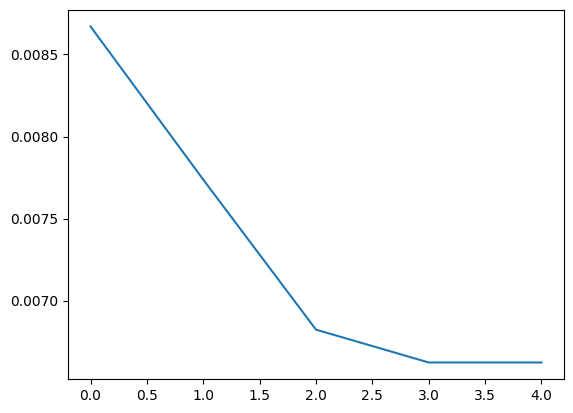

In [65]:
plt.plot(convergence[0])

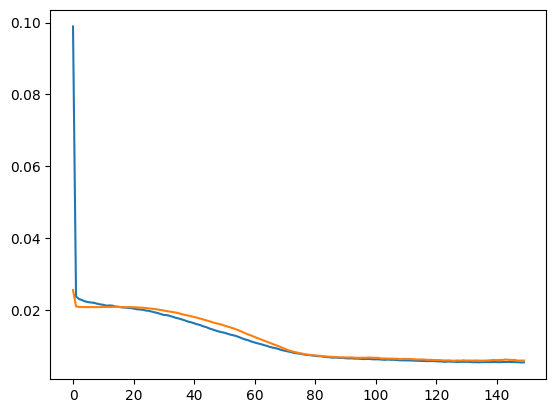

In [66]:
plt.plot(train_losses)
plt.plot(val_losses)

In [69]:
print(f"r2_score : {r2_score(test_scaled_y, test_preds.flatten())}")
print(f"mean_squared_error : {np.sqrt(mean_squared_error(test_scaled_y, test_preds.flatten()))}")
print(f"mean_absolute_percentage_error:{mean_absolute_percentage_error(test_scaled_y, test_preds.flatten())}")

array([[0.7897055 ],
       [0.82073   ],
       [0.8301685 ],
       ...,
       [0.44557297],
       [0.4195283 ],
       [0.38174188]], dtype=float32)

r2_score : 0.7967385882928595
mean_squared_error : 4703.524864289848
mean_absolute_percentage_error:0.05560862581959567


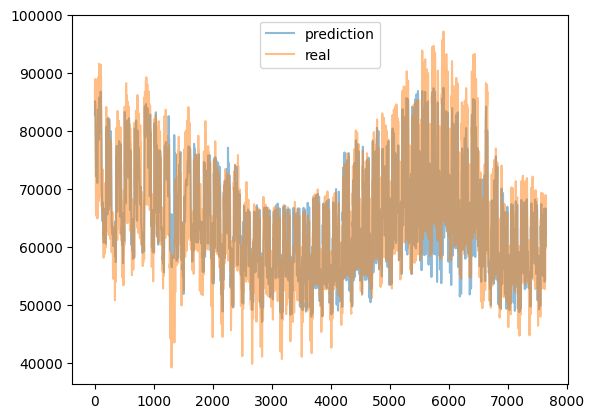

In [87]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error

# 역변환 후 생성
inverse_prediction = mny.inverse_transform(test_preds)
inverse_real = mny.inverse_transform(test_scaled_y)

plt.plot(inverse_prediction, alpha=0.5, label = "prediction")
plt.plot(inverse_real[24:], alpha=0.5, label = "real")
plt.legend()

# 평가지표 계산
print(f"r2_score : {r2_score(inverse_real.flatten()[24:], inverse_prediction.flatten())}")
print(f"mean_squared_error : {np.sqrt(mean_squared_error(inverse_real.flatten()[24:], inverse_prediction.flatten()))}")
print(f"mean_absolute_percentage_error:{mean_absolute_percentage_error(inverse_real.flatten()[24:], inverse_prediction.flatten())}")

# 이후 데이터프레임 생성


### 각 모델의 최적화 그래프 생성

In [95]:
import plotly.express as px

# 직접 입력
df = pd.DataFrame(dict(
    r=[1, 5, 2, 2, 3],
    theta=['processing cost','mechanical properties','chemical stability',
           'thermal stability', 'device integration']))

fig = px.line_polar(df, r='r', theta='theta', line_close=True)
fig.update_traces(fill='toself')

fig.show()

In [130]:
metrics = pd.DataFrame()    
# 
r=["MAPE", "R2 Score" ,"RMSE"],
theta=[[6.25, 0.543, 6050],
           [5.56, 0.797, 4703.52],
           [3.89, 0.909, 3128.44]]

metrics["MAPE"] = [6.25, 5.56, 3.89] 
metrics["R2 Score"] = [0.543, 0.797, 0.909] 
metrics["RMSE"] = [6050, 4703.52, 3128.44] 

metrics_1 = metrics.T
metrics_1.rename(columns = {0 : "SARIMAX",
                            1 : "LSTM",
                            2 : "SARIMAX-LSTM"}, inplace = True)



In [134]:
px.data.wind()

,direction,strength,frequency
0,N,0-1,0.5
1,NNE,0-1,0.6
2,NE,0-1,0.5
3,ENE,0-1,0.4
4,E,0-1,0.4
...,...,...,...
123,WSW,6+,0.1
124,W,6+,0.9
125,WNW,6+,2.2
126,NW,6+,1.5


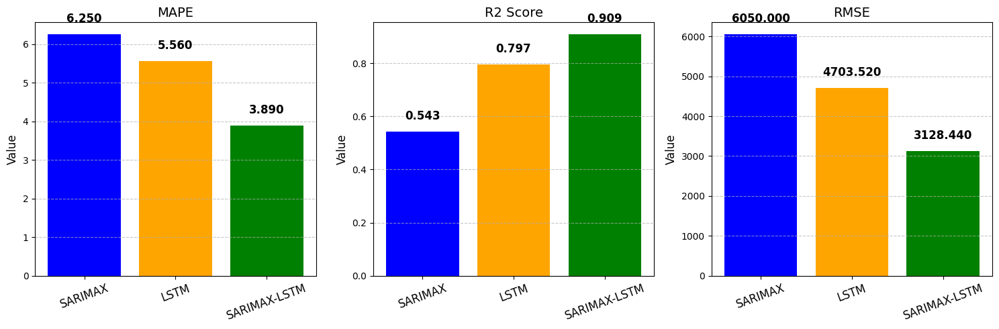

In [151]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# 데이터프레임 생성
df = pd.DataFrame({
    "Metric": ["MAPE", "R2 Score", "RMSE"],
    "SARIMAX": [6.25, 0.543, 6050],
    "LSTM": [5.56, 0.797, 4703.52],
    "SARIMAX-LSTM": [3.89, 0.909, 3128.44]
})

# 그래프 개별 생성
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
metrics = df["Metric"].tolist()
colors = {"SARIMAX": "blue", "LSTM": "orange", "SARIMAX-LSTM": "green"}

for i, metric in enumerate(metrics):
    ax = axes[i]
    values = df[df["Metric"] == metric].iloc[:, 1:].values.flatten()
    models = df.columns[1:].tolist()

    ax.bar(models, values, color=[colors[m] for m in models])
    ax.set_title(metric, fontsize=14)
    ax.set_ylabel("Value", fontsize=12)
    ax.set_xticklabels(models, rotation=20, fontsize=12)
    ax.grid(axis="y", linestyle="--", alpha=0.7)

    # 값 표시
    for j, v in enumerate(values):
        ax.text(j, v + max(values) * 0.05, f"{v:.3f}", ha='center', fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()


<BarContainer object of 3 artists>

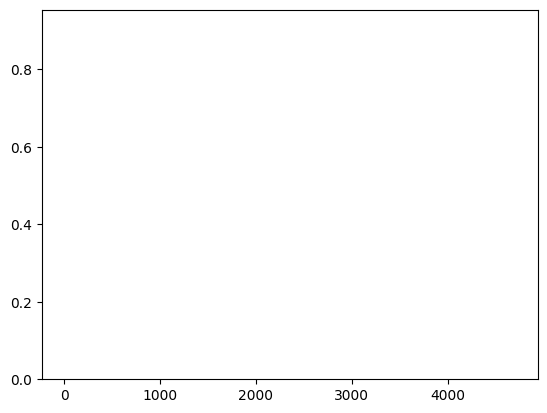

In [149]:
# 막대 그래프 생성
plt.bar(metrics_1["LSTM"], metrics_1.iloc[1,:])

In [137]:
fig = px.line_polar(metrics_1, r="SARIMAX-LSTM", theta="SARIMAX-LSTM", line_close=True)

# 내부 색칠하기
fig.update_traces(fill='toself')

fig.show()

In [113]:
metrics_1[0]

MAPE           6.250
R2 Score       0.543
RMSE        6050.000
Name: 0, dtype: float64